In [3]:
from __future__ import absolute_import, division, print_function

import argparse
import os

import warnings ; warnings.filterwarnings('ignore')
os.environ['CUDA_DEVICE_ORDER']='PCI_BUS_ID'
os.environ['OMP_NUM_THREADS'] = '1'
import argparse
import collections
import os
import random
import tempfile
from argparse import RawTextHelpFormatter

import gfootball.env as football_env
import gym
import numpy as np
import ray
import ray.cloudpickle as cloudpickle
import torch
from gfootball import env as fe
from ray import tune
from ray.rllib.agents import ppo
from ray.rllib.policy.sample_batch import SampleBatch
from ray.rllib.utils.spaces.space_utils import flatten_to_single_ndarray
from ray.tune.registry import get_trainable_cls, register_env,  register_trainable
from rldm.utils import football_tools as ft
from rldm.utils import gif_tools as gt
from rldm.utils import system_tools as st
from IPython.display import HTML

In [22]:
from gfootball.env.wrappers import CheckpointRewardWrapper

def reward_modified(self,reward):
    '''
    o['active'] => 1 or 2 
    '''
    #change checkpoints to only 4
    #self._num_checkpoints = 4
    
    #assuming max of 500 steps 
    passing_rewards = 0.002 
    shoting_rewards = 0.1
    not_owning_ball_team = -0.001
    owning_ball = 0.001
    observation = self.env.unwrapped.observation()
    actions = self.env.unwrapped._get_actions()
    #print(observation)
    if observation is None:
        return reward

    assert len(reward) == len(observation)

    for rew_index in range(len(reward)):
        o = observation[rew_index]
        a = actions[rew_index]
        if reward[rew_index] == 1: #scoring a goal
            reward[rew_index] += self._checkpoint_reward * (
                self._num_checkpoints -
                self._collected_checkpoints.get(rew_index, 0))
            self._collected_checkpoints[rew_index] = self._num_checkpoints
            #add extra points to compensate for the extra postive rewards
            reward[rew_index] += 0.5
            continue
        
        #check if the right team does own the ball, this should be the first objective in the game
        if o['ball_owned_team'] != 0:
            #reward[rew_index] += not_owning_ball_team
            #player need to get closer to get the ball 
            player_pos = o['right_team'][o['active']]
            player_ball_dist = ((o['ball'][0] - player_pos[0]) ** 2 + (o['ball'][1]-player_pos[1]) ** 2) ** 0.5
            reward[rew_index] += player_ball_dist*not_owning_ball_team
        else:
            #they should positive reward for owning the ball too
            reward[rew_index] += owning_ball
            
        
        
        # Check if the active player has the ball.
        if ('ball_owned_team' not in o or
          o['ball_owned_team'] != 0 or
          'ball_owned_player' not in o or
          o['ball_owned_player'] != o['active']):
            continue
        #now, we know that the active player has the ball
        #reward passing if the second player is closer to goal
        #reward shooting if active player is near the goal
        passing_thre = 0.05
        position_second_player = o['right_team'][1 if o['active']==2 else 2]
        dist_second_player = ((position_second_player[0] - 1) ** 2 + position_second_player[1] ** 2) ** 0.5
        d = ((o['ball'][0] - 1) ** 2 + o['ball'][1] ** 2) ** 0.5 #ball dist to goal (the active player too)
        player_distances = ((o['ball'][0] - position_second_player[0]) ** 2 + (o['ball'][1]-position_second_player[1]) ** 2) ** 0.5
        #if the ball is very close, shooting would be better than passing
        if dist_second_player + passing_thre < d and d > 0.3: 
            if player_distances < 0.2 and a == 11: #short pass when they are near each other
                reward[rew_index] += passing_rewards
            elif player_distances > 0.2 and (a == 9 or a==10):
                reward[rew_index] += passing_rewards
        #now check if the ball is near target, then rewarding shotting 
        if d < 0.4 and a ==12:
            reward[rew_index] += shoting_rewards
            

        # Collect the checkpoints.
        # We give reward for distance 1 to 0.2.
        while (self._collected_checkpoints.get(rew_index, 0) <
             self._num_checkpoints):
            if self._num_checkpoints == 1:
                threshold = 0.99 - 0.8
            else:
                threshold = (0.99 - 0.8 / (self._num_checkpoints - 1) *
                           self._collected_checkpoints.get(rew_index, 0))
            if d > threshold:
                break
            reward[rew_index] += self._checkpoint_reward
            self._collected_checkpoints[rew_index] = (
                self._collected_checkpoints.get(rew_index, 0) + 1)
    return reward

CheckpointRewardWrapper.reward = reward_modified


In [23]:
class DefaultMapping(collections.defaultdict):
    """default_factory now takes as an argument the missing key."""

    def __missing__(self, key):
        self[key] = value = self.default_factory(key)
        return value

STAT_FUNC = {
    'min': np.min,
    'mean': np.mean,
    'median': np.median,
    'max': np.max,
    'std': np.std,
    'var': np.var,
}

In [24]:
!rm -rf /tmp/football/*

In [25]:
!ls -l /mnt/logs/baselines/**/**

-rw-r--r-- 1 jovyan users 2186 Jun 22 17:19 /mnt/logs/baselines/baseline_1/params.json
-rw-r--r-- 1 jovyan users 3090 Jun 22 17:19 /mnt/logs/baselines/baseline_1/params.pkl
-rw-r--r-- 1 jovyan users 2199 Jun 22 17:19 /mnt/logs/baselines/baseline_2/params.json
-rw-r--r-- 1 jovyan users 3095 Jun 22 17:19 /mnt/logs/baselines/baseline_2/params.pkl
-rw-r--r-- 1 jovyan users 2185 Jun 22 17:19 /mnt/logs/baselines/baseline_3/params.json
-rw-r--r-- 1 jovyan users 3090 Jun 22 17:19 /mnt/logs/baselines/baseline_3/params.pkl

/mnt/logs/baselines/baseline_1/checkpoint_0:
total 14776
-rw-r--r-- 1 jovyan users 15122984 Jun 22 17:19 checkpoint-0
-rw-r--r-- 1 jovyan users      184 Jun 22 17:19 checkpoint-0.tune_metadata

/mnt/logs/baselines/baseline_2/checkpoint_0:
total 13876
-rw-r--r-- 1 jovyan users 14201365 Jun 22 17:19 checkpoint-0
-rw-r--r-- 1 jovyan users      184 Jun 22 17:19 checkpoint-0.tune_metadata

/mnt/logs/baselines/baseline_3/checkpoint_0:
total 10932
-rw-r--r-- 1 jovyan users 11187733 

In [26]:
# CHECKPOINT TO LOAD
# here are some example checkpoints from the baseline teams...
checkpoint = "/mnt/logs/baselines/baseline_1/checkpoint_0/checkpoint-0"
# checkpoint = "/mnt/logs/baselines/baseline_2/checkpoint_0/checkpoint-0"
# checkpoint = "/mnt/logs/baselines/baseline_3/checkpoint_0/checkpoint-0"
#checkpoint = "/mnt/logs/training_MADDPG_3_vs_3_auto_GK_independent_18750000_fifo_fixed/PPO_3_vs_3_auto_GK_db132_00000_0_2022-07-07_07-38-55/checkpoint_000500/checkpoint-500"
num_episodes = 4
debug = False
#algorithm = "MADDPG"
algorithm = "PPO"


In [27]:

assert checkpoint, "A checkpoint string is required"

assert num_episodes <= 10, "Must rollout a maximum of 10 episodes--rendering takes a very long time"
assert num_episodes >= 1, "Must rollout at least 1 episode"

n_cpus, _ = st.get_cpu_gpu_count()
assert n_cpus >= 2, "Didn't find enough cpus"

config = {}
config_dir = os.path.dirname(checkpoint)
config_path = os.path.join(config_dir, "../params.pkl")

assert os.path.exists(config_path), "Could not find a proper config from checkpoint"
with open(config_path, "rb") as f:
    config = cloudpickle.load(f)

config["create_env_on_driver"] = True
config["log_level"] = 'DEBUG' if debug else 'ERROR' 
config["num_workers"] = 1
config["num_gpus"] = 0
test_env_name="3_vs_3_auto_GK" # this semester we're only doing 3v3 w auto GK

In [10]:
ray.init(ignore_reinit_error=True, log_to_driver=debug, include_dashboard=False,
         local_mode=True, logging_level='DEBUG' if debug else 'ERROR')

{'node_ip_address': '172.17.0.2',
 'raylet_ip_address': '172.17.0.2',
 'redis_address': '172.17.0.2:59079',
 'object_store_address': '/tmp/ray/session_2022-07-14_17-15-56_321676_2161/sockets/plasma_store',
 'raylet_socket_name': '/tmp/ray/session_2022-07-14_17-15-56_321676_2161/sockets/raylet',
 'webui_url': None,
 'session_dir': '/tmp/ray/session_2022-07-14_17-15-56_321676_2161',
 'metrics_export_port': 61604,
 'node_id': '66eaa66b07afaef71d41208e3a234d7c563ca42c635a1c42948d72f1'}

In [11]:
# pip install tensorflow-probability==0.7.0

In [12]:
# from rldm.utils import football_tools as ft
# num_players = 3 # hard-coding 3 here for now
# env_name = ft.n_players_to_env_name(num_players, True) # hard-coding auto GK
# shared_policy = False
# n_policies = 1 if shared_policy else num_players - 1 # hard-coding
# obs_space, act_space = ft.get_obs_act_space(env_name)

# def gen_policy(idx):
#     return (None, obs_space[f'player_{idx}'], act_space[f'player_{idx}'], {})

# policies = {
#     'agent_{}'.format(idx): gen_policy(idx) for idx in range(n_policies)
# }
# policy_ids = list(policies.keys())
# assert len(policy_ids) == 1 or n_policies == len(obs_space), \
#     "Script expects either shared or independent policies for all players"
# policy_mapping_fn = lambda agent_id, episode, **kwargs: \
#     policy_ids[0 if len(policy_ids) == 1 else int(agent_id.split('_')[1])]

# default_multiagent = {
#     'policies': policies,
#     'policy_mapping_fn': policy_mapping_fn,
# }

# print(default_multiagent)
# shared_policy = {'agent_0': gen_policy(0)}
# shared_policy_mapping_fn = lambda agent_id, episode, **kwargs: 'agent_0'
# shared_multiagent = {
#     'policies': shared_policy,
#     'policy_mapping_fn': shared_policy_mapping_fn,
# }

# config = {
#     'env': env_name,
#     'train_batch_size': 2_800,
#     'rollout_fragment_length': 100,
#     'num_workers': 0, # one goes to the trainer
#     'num_envs_per_worker': 1,
#     'log_level': 'INFO',
#     'multiagent': default_multiagent,
# }

In [13]:
# register_env(config['env'], lambda _: ft.RllibGFootball(env_name=config['env']))
# from rldm.utils.collection_tools import deep_merge
# import ray.rllib.contrib.maddpg.maddpg as maddpg
# MADDPGAgent = maddpg.MADDPGTrainer.with_updates(
#     # mixins=[CustomStdOut]
# )
# register_trainable("MADDPG", MADDPGAgent)
#  # Make sure worker 0 has an Env.
# config["create_env_on_driver"] = True
# config["evaluation_num_workers"] = config.get("num_workers", 0)
# #print(config)
# cls = get_trainable_cls(algorithm)
# agent = cls(env=config['env'], config=config)

# #agent.restore(checkpoint)




In [14]:
# agent.restore(checkpoint_path=checkpoint)

In [28]:
register_env(test_env_name, lambda _: ft.RllibGFootball(env_name=test_env_name))
cls = get_trainable_cls(algorithm)
agent = cls(env=test_env_name, config=config)
agent.restore(checkpoint)

In [29]:
try:
    del env
except:
    pass

env = ft.RllibGFootball(env_name=config['env'], write_video=True, render=True)

In [30]:
policy_agent_mapping = agent.config["multiagent"]["policy_mapping_fn"]
policy_map = agent.workers.local_worker().policy_map
state_init = {p: m.get_initial_state() for p, m in policy_map.items()}
use_lstm = {p: len(s) > 0 for p, s in state_init.items()}

action_init = {
    p: flatten_to_single_ndarray(m.action_space.sample())
    for p, m in policy_map.items()
}

eps_stats = {}
eps_stats['rewards_total'] = []
eps_stats['timesteps'] = []
eps_stats['score_reward'] = []
eps_stats['win_perc'] = []
eps_stats['undefeated_perc'] = []
for eidx in range(num_episodes):
    mapping_cache = {}  # in case policy_agent_mapping is stochastic

    obs = env.reset()
    agent_states = DefaultMapping(
        lambda player_id: state_init[mapping_cache[player_id]])
    prev_actions = DefaultMapping(
        lambda player_id: action_init[mapping_cache[player_id]])
    prev_rewards = collections.defaultdict(lambda: 0.)

    done = False
    eps_stats['rewards_total'].append({a:0.0 for a in obs})
    eps_stats['timesteps'].append(-1)
    eps_stats['score_reward'].append(0)
    eps_stats['win_perc'].append(0)
    eps_stats['undefeated_perc'].append(0)
    while not done:
        actions = {}
        for player_id, a_obs in obs.items():
            policy_id = mapping_cache.setdefault(
                player_id, policy_agent_mapping(player_id, None))
            p_use_lstm = use_lstm[policy_id]
            if p_use_lstm:
                a_action, p_state, _ = agent.compute_single_action(
                    a_obs,
                    state=agent_states[player_id],
                    prev_action=prev_actions[player_id],
                    prev_reward=prev_rewards[player_id],
                    policy_id=policy_id)
                agent_states[player_id] = p_state
            else:
                a_action = agent.compute_single_action(
                    a_obs,
                    prev_action=prev_actions[player_id],
                    prev_reward=prev_rewards[player_id],
                    policy_id=policy_id)

            a_action = flatten_to_single_ndarray(a_action)
            actions[player_id] = a_action
            prev_actions[player_id] = a_action

        next_obs, rewards, dones, infos = env.step(actions)

        done = dones['__all__']
        for player_id, r in rewards.items():
            prev_rewards[player_id] = r
            eps_stats['rewards_total'][-1][player_id] += r

        obs = next_obs
        eps_stats['timesteps'][-1] += 1

    eps_stats['score_reward'][-1] = infos['player_0']['score_reward']
    game_result = "loss" if infos['player_0']['score_reward'] == -1 else \
        "win" if infos['player_0']['score_reward'] == 1 else "tie"
    eps_stats['win_perc'][-1] = int(game_result == "win")
    eps_stats['undefeated_perc'][-1] = int(game_result != "loss")
    print(f"\nEpisode #{eidx+1} ended with a {game_result}:")
    for p, r in eps_stats['rewards_total'][-1].items():
        print("\t{} got episode reward: {:.2f}".format(p, r))
    print("\tTotal reward: {:.2f}".format(sum(eps_stats['rewards_total'][-1].values())))

eps_stats['rewards_total'] = {k: [dic[k] for dic in eps_stats['rewards_total']] \
    for k in eps_stats['rewards_total'][0]}
print("\n\nAll trials completed:")
for stat_name, values in eps_stats.items():
    print(f"\t{stat_name}:")
    if type(values) is dict:
        for stat_name2, values2 in values.items():
            print(f"\t\t{stat_name2}:")
            for func_name, func in STAT_FUNC.items():
                print("\t\t\t{}: {:.2f}".format(func_name, func(values2)))
    else:
        for func_name, func in STAT_FUNC.items():
            print("\t\t{}: {:.2f}".format(func_name, func(values)))


Episode #1 ended with a win:
	player_0 got episode reward: 2.54
	player_1 got episode reward: 2.75
	Total reward: 5.29

Episode #2 ended with a tie:
	player_0 got episode reward: -0.01
	player_1 got episode reward: -0.00
	Total reward: -0.01

Episode #3 ended with a tie:
	player_0 got episode reward: 0.00
	player_1 got episode reward: 0.80
	Total reward: 0.80

Episode #4 ended with a tie:
	player_0 got episode reward: -0.04
	player_1 got episode reward: -0.00
	Total reward: -0.05


All trials completed:
	rewards_total:
		player_0:
			min: -0.04
			mean: 0.62
			median: -0.00
			max: 2.54
			std: 1.11
			var: 1.23
		player_1:
			min: -0.00
			mean: 0.89
			median: 0.40
			max: 2.75
			std: 1.12
			var: 1.26
	timesteps:
		min: 15.00
		mean: 118.75
		median: 93.50
		max: 273.00
		std: 97.07
		var: 9423.19
	score_reward:
		min: 0.00
		mean: 0.25
		median: 0.00
		max: 1.00
		std: 0.43
		var: 0.19
	win_perc:
		min: 0.00
		mean: 0.25
		median: 0.00
		max: 1.00
		std: 0.43
		var: 0.19
	undefe

In [18]:
!ls /tmp/football

episode_done_20220714-171621520235.avi
episode_done_20220714-171621520235.dump
episode_done_20220714-171658572646.avi
episode_done_20220714-171658572646.dump
episode_done_20220714-171742414860.avi
episode_done_20220714-171742414860.dump
episode_done_20220714-171814136026.avi
episode_done_20220714-171814136026.dump
score_20220714-171650840155.avi
score_20220714-171650840155.dump
score_20220714-171806702844.avi
score_20220714-171806702844.dump



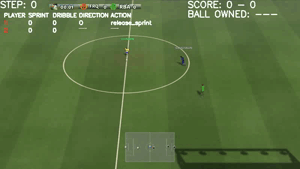
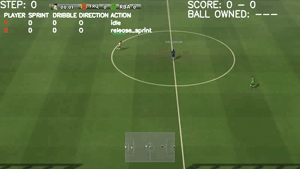
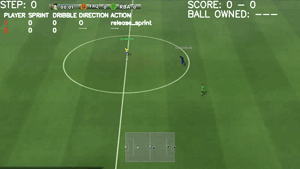
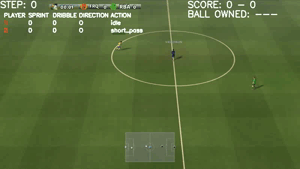

In [19]:
data = gt.get_gif_html(videos_path="/tmp/football/episode_done_*.avi", 
                       title="Full episodes")
HTML(data=data)


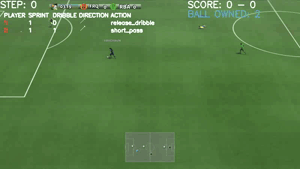

In [13]:
data = gt.get_gif_html(videos_path="/tmp/football/lost_score_*.avi", 
                       title="Lost episodes")
HTML(data=data)


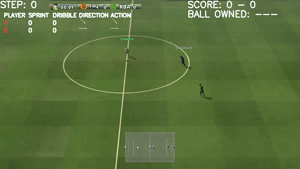
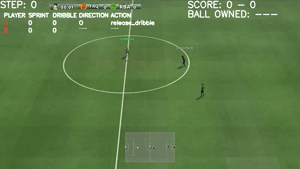
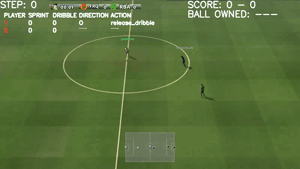
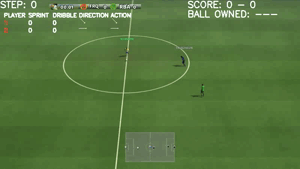
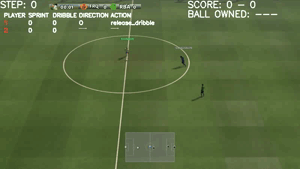

In [14]:
data = gt.get_gif_html(videos_path="/tmp/football/score_*.avi", 
                       title="Won episodes")
HTML(data=data)